In [6]:
import pandas as pd 
import wandb
api = wandb.Api()

# Project is specified by <entity/project-name>
runs = api.runs("yangbn/multi_source_retrieval")

# summary_list, config_list, name_list = [], [], []
run_list = []
sweep_id = "phi07f6s"
for run in runs: 
    run_dict = {}
    # .summary contains the output keys/values for metrics like accuracy.
    #  We call ._json_dict to omit large files 
    if not hasattr(run, "sweep") or not hasattr(run.sweep, "id"):
        continue
    if run.sweep.id == sweep_id:
        for k,v in run.summary._json_dict.items():
            if not k.startswith('_'):
                run_dict[k] = v
        for k,v in run.config.items():
            if not k.startswith('_'):
                run_dict[k] = v
        run_list.append(run_dict)

# runs_df = pd.DataFrame({
#     "summary": summary_list,
#     "config": config_list,
#     "name": name_list
#     })

# runs_df.to_csv(f"{sweep_id}.csv")

In [7]:
df = pd.DataFrame(run_list)#.to_csv(f"{sweep_id}.csv")

In [8]:
df['select_propotion'].unique()

KeyError: 'select_propotion'

In [ ]:
df['gnn_model1'] * df['gnn_model2'] * df['loss_type1'] * df['loss_type2'] 

0      GraphSAGE
1      GraphSAGE
2      GraphSAGE
3      GraphSAGE
4      GraphSAGE
         ...    
889          GCN
890          GCN
891          GCN
892          GCN
893          GCN
Name: gnn_model1, Length: 894, dtype: object

In [ ]:
len(df.query('gnn_model1 == "GraphSAGE" and gnn_model2 == "GAT" and loss_type1 == "MSE" and loss_type2 == "MSE"'))

11

In [ ]:
models = df['gnn_model1'].unique()
loss_types = df['loss_type1'].unique()

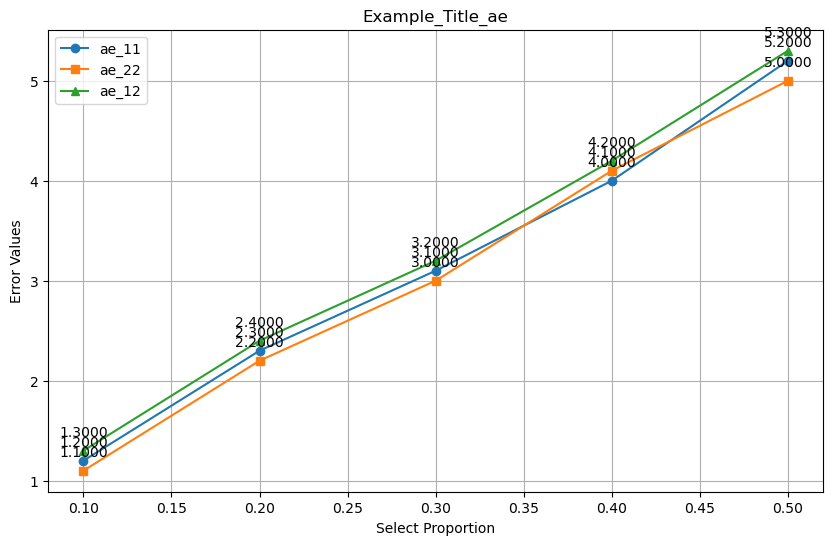

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

def plot_subdf(title, sub_df, error_function="ae"):
    # 重置索引
    sub_df = sub_df.reset_index(drop=True)

    # 按 select_proportion 列排序
    sub_df = sub_df.sort_values(by='select_proportion')

    # 确保数据类型为浮点数
    for col in [f'max_{error_function}_dist1', f'max_{error_function}_dist2', f'max_{error_function}_dist3']:
        sub_df[col] = sub_df[col].astype(float)

    # # 打印调试信息
    # print(sub_df)

    plt.figure(figsize=(10, 6))

    # 使用点线结合的方式绘制图表
    plt.plot(sub_df['select_proportion'], sub_df[f'max_{error_function}_dist1'], marker='o', linestyle='-', label=f'{error_function}_11')
    plt.plot(sub_df['select_proportion'], sub_df[f'max_{error_function}_dist2'], marker='s', linestyle='-', label=f'{error_function}_22')
    plt.plot(sub_df['select_proportion'], sub_df[f'max_{error_function}_dist3'], marker='^', linestyle='-', label=f'{error_function}_12')

    # 在数据点上标注值
    for i, txt in enumerate(sub_df[f'max_{error_function}_dist1']):
        plt.annotate(f'{txt:.4f}', (sub_df['select_proportion'].iloc[i], sub_df[f'max_{error_function}_dist1'].iloc[i]), textcoords="offset points", xytext=(0,10), ha='center')
    for i, txt in enumerate(sub_df[f'max_{error_function}_dist2']):
        plt.annotate(f'{txt:.4f}', (sub_df['select_proportion'].iloc[i], sub_df[f'max_{error_function}_dist2'].iloc[i]), textcoords="offset points", xytext=(0,10), ha='center')
    for i, txt in enumerate(sub_df[f'max_{error_function}_dist3']):
        plt.annotate(f'{txt:.4f}', (sub_df['select_proportion'].iloc[i], sub_df[f'max_{error_function}_dist3'].iloc[i]), textcoords="offset points", xytext=(0,10), ha='center')

    plt.xlabel('Select Proportion')
    plt.ylabel('Error Values')
    plt.title(f"{title}_{error_function}")
    plt.legend()
    plt.grid(True)
    plt.savefig(f"./factors/{title}_{error_function}.png")
    plt.show()

# 示例使用
data = {
    'select_proportion': [0.1, 0.2, 0.3, 0.4, 0.5],
    'max_ae_dist1': [1.2, 2.3, 3.1, 4.0, 5.2],
    'max_ae_dist2': [1.1, 2.2, 3.0, 4.1, 5.0],
    'max_ae_dist3': [1.3, 2.4, 3.2, 4.2, 5.3]
}
sub_df = pd.DataFrame(data)

plot_subdf('Example_Title', sub_df)


In [52]:
def plot_subdf(ax, sub_df, error_function="mse"):
    sub_df = sub_df.reset_index(drop=True)
    sub_df = sub_df.sort_values(by='select_proportion')

    # 确保数据类型为浮点数
    for col in [f'max_{error_function}_dist1', f'max_{error_function}_dist2', f'max_{error_function}_dist3']:
        sub_df[col] = sub_df[col].astype(float)

    if error_function == "mse":
        legend = "Mean Squre Error"
    elif error_function == "ae":
        legend = "Mean Absolute Error"
    elif error_function == "me":
        legend = "Max Absolute Error"

    # 使用点线结合的方式绘制图表
    ax.plot(sub_df['select_proportion'], sub_df[f'max_{error_function}_dist1'], marker='o', linestyle='-', label=f'{legend}_11')
    ax.plot(sub_df['select_proportion'], sub_df[f'max_{error_function}_dist2'], marker='s', linestyle='-', label=f'{legend}_22')
    ax.plot(sub_df['select_proportion'], sub_df[f'max_{error_function}_dist3'], marker='^', linestyle='-', label=f'{legend}_12')

    # 在数据点上标注值
    for i, txt in enumerate(sub_df[f'max_{error_function}_dist1']):
        ax.annotate(f'{txt:.4f}', (sub_df['select_proportion'].iloc[i], sub_df[f'max_{error_function}_dist1'].iloc[i]), textcoords="offset points", xytext=(0,10), ha='center', rotation=45)
    for i, txt in enumerate(sub_df[f'max_{error_function}_dist2']):
        ax.annotate(f'{txt:.4f}', (sub_df['select_proportion'].iloc[i], sub_df[f'max_{error_function}_dist2'].iloc[i]), textcoords="offset points", xytext=(0,10), ha='center', rotation=45)
    for i, txt in enumerate(sub_df[f'max_{error_function}_dist3']):
        ax.annotate(f'{txt:.4f}', (sub_df['select_proportion'].iloc[i], sub_df[f'max_{error_function}_dist3'].iloc[i]), textcoords="offset points", xytext=(0,10), ha='center')

    ax.set_xlabel(r'Overlap Ratio ($\alpha$)')
    ax.set_ylabel('Error Values')
    ax.legend()
    ax.grid(True)

In [48]:
# len(loss_types)

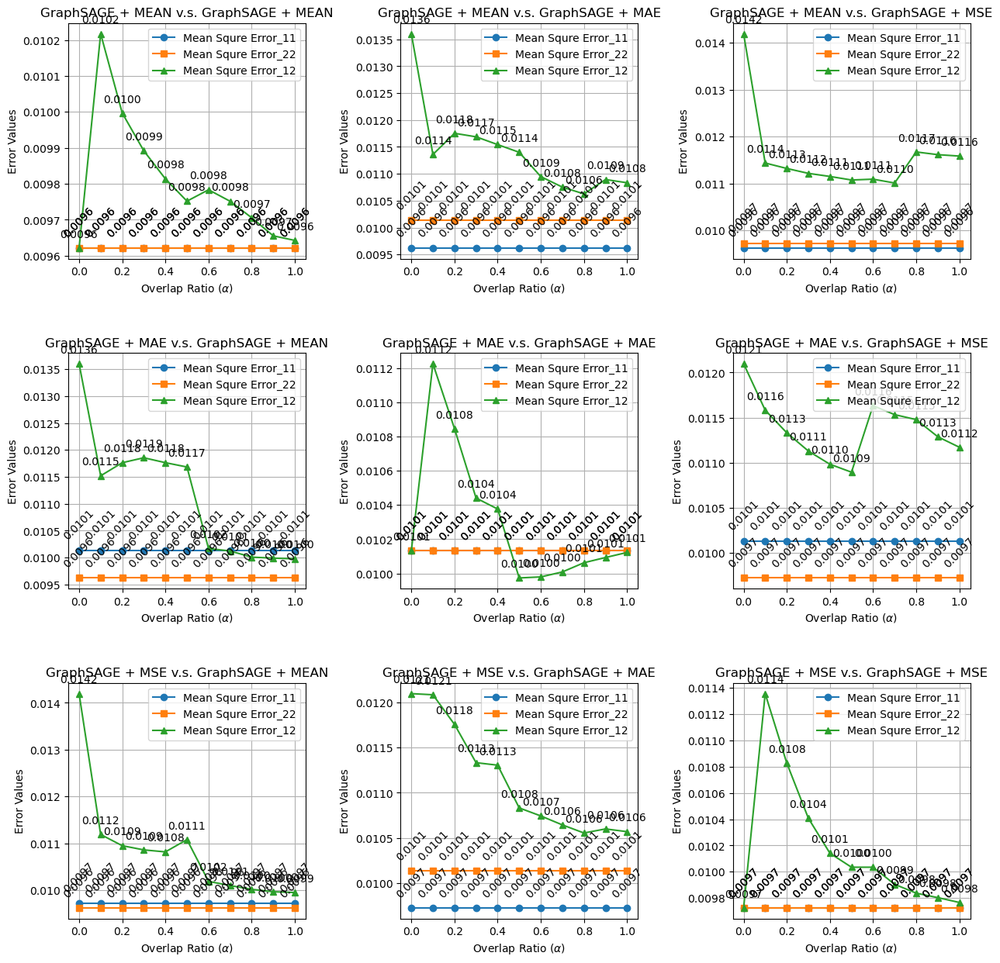

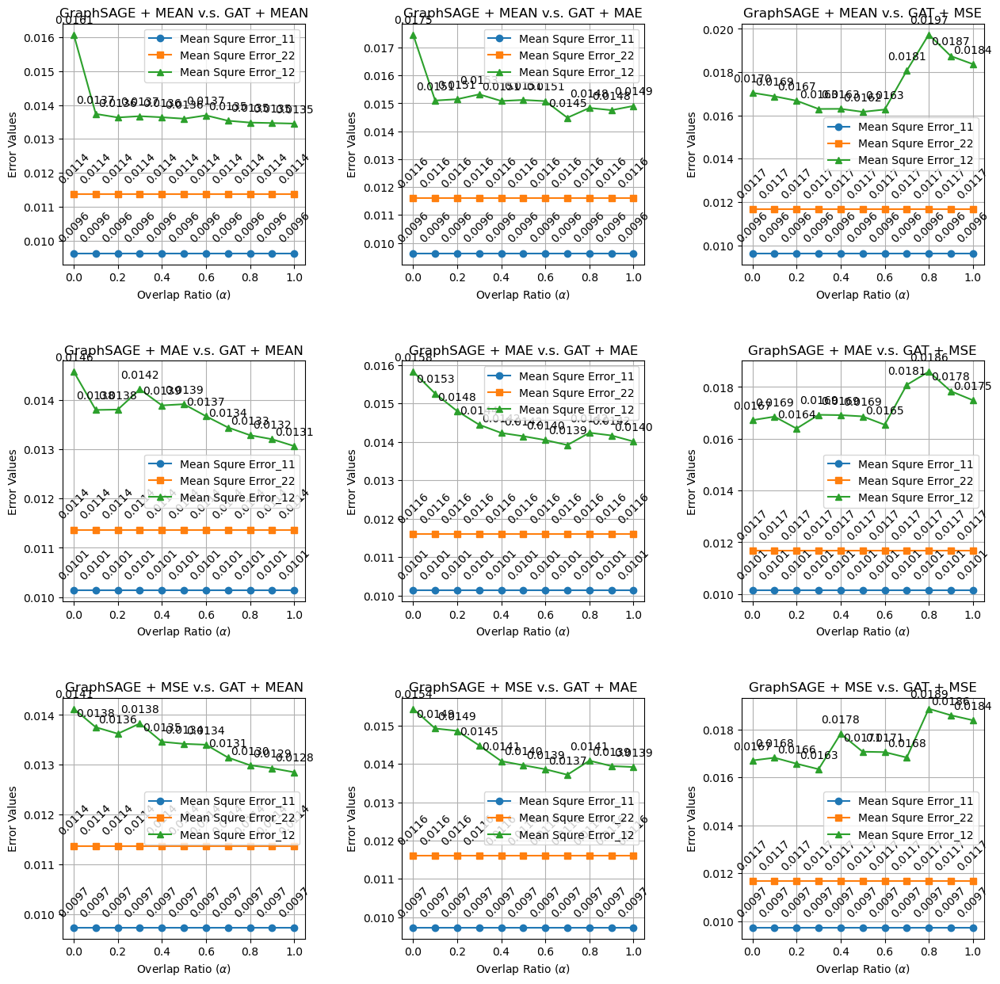

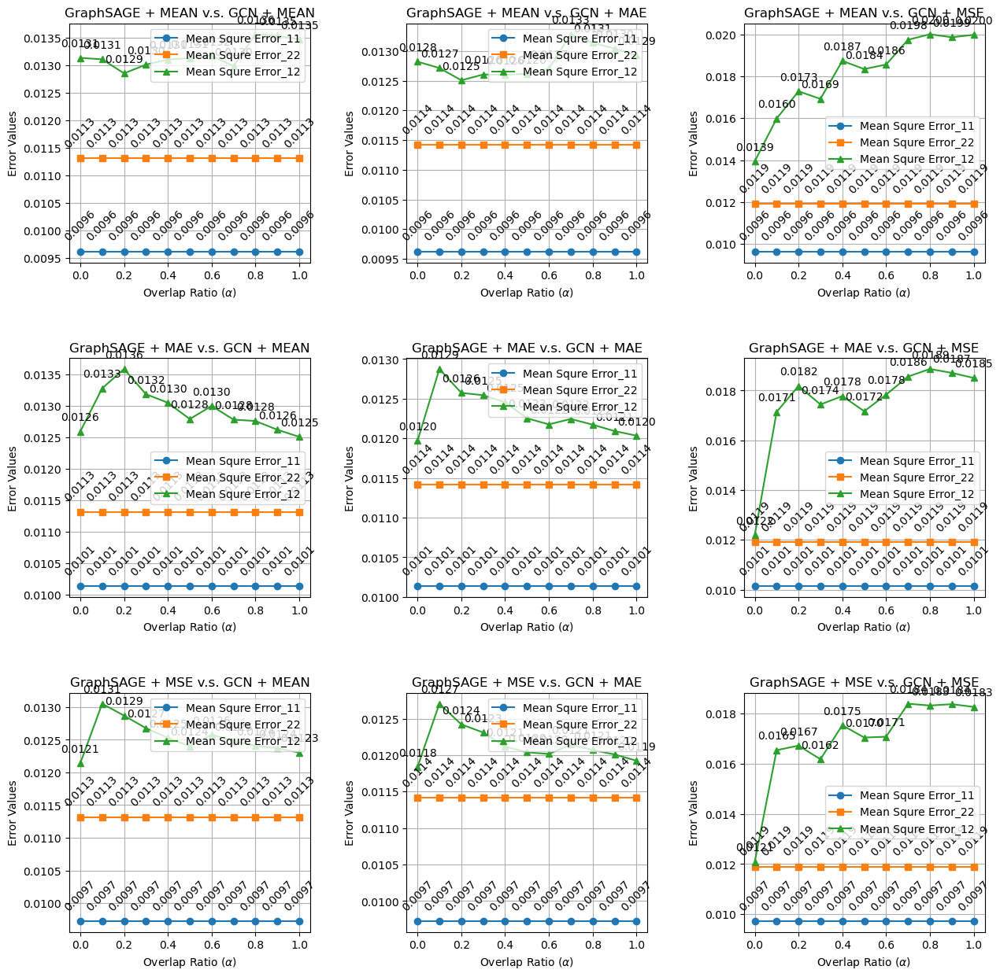

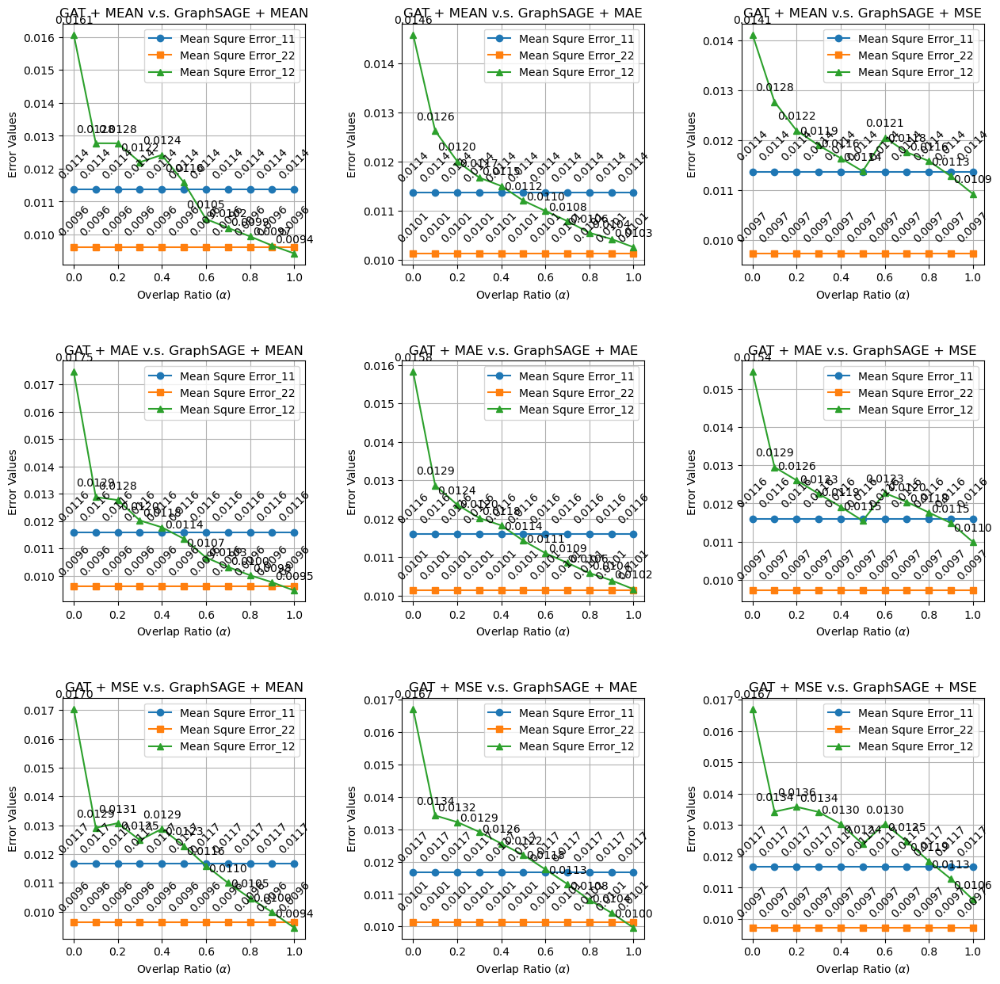

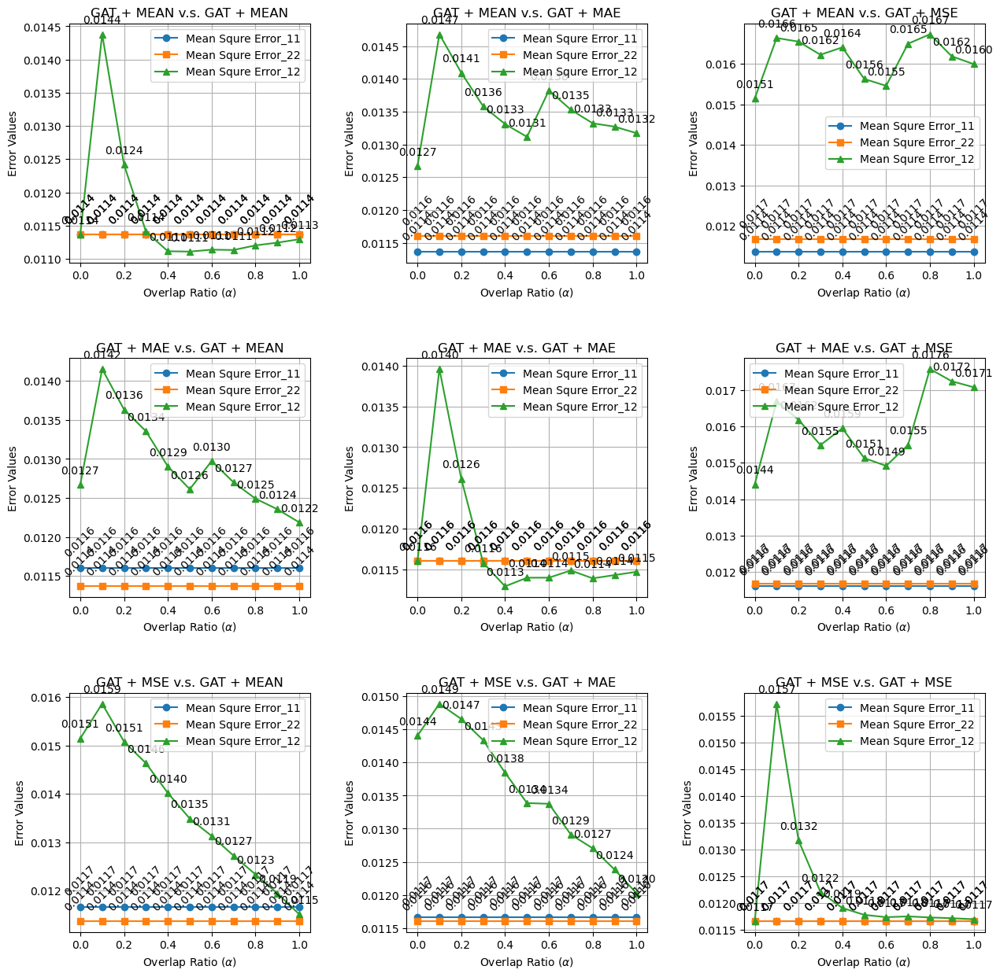

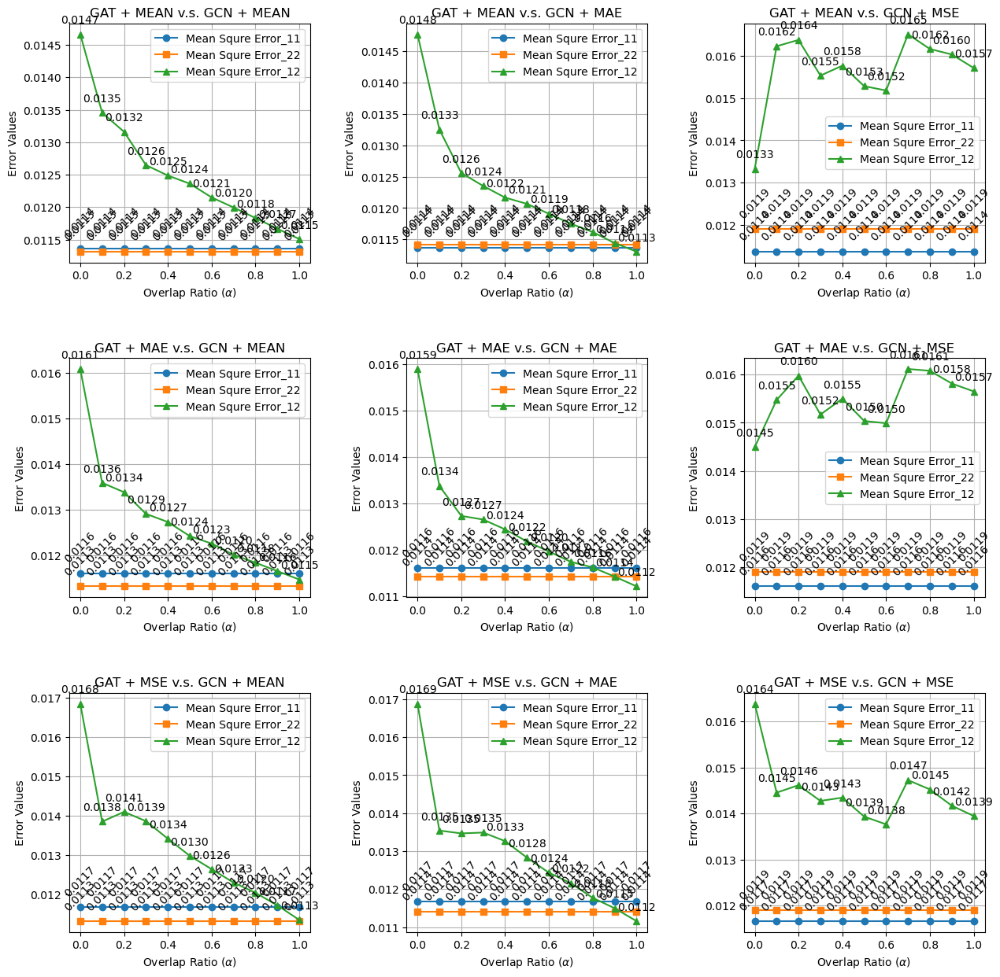

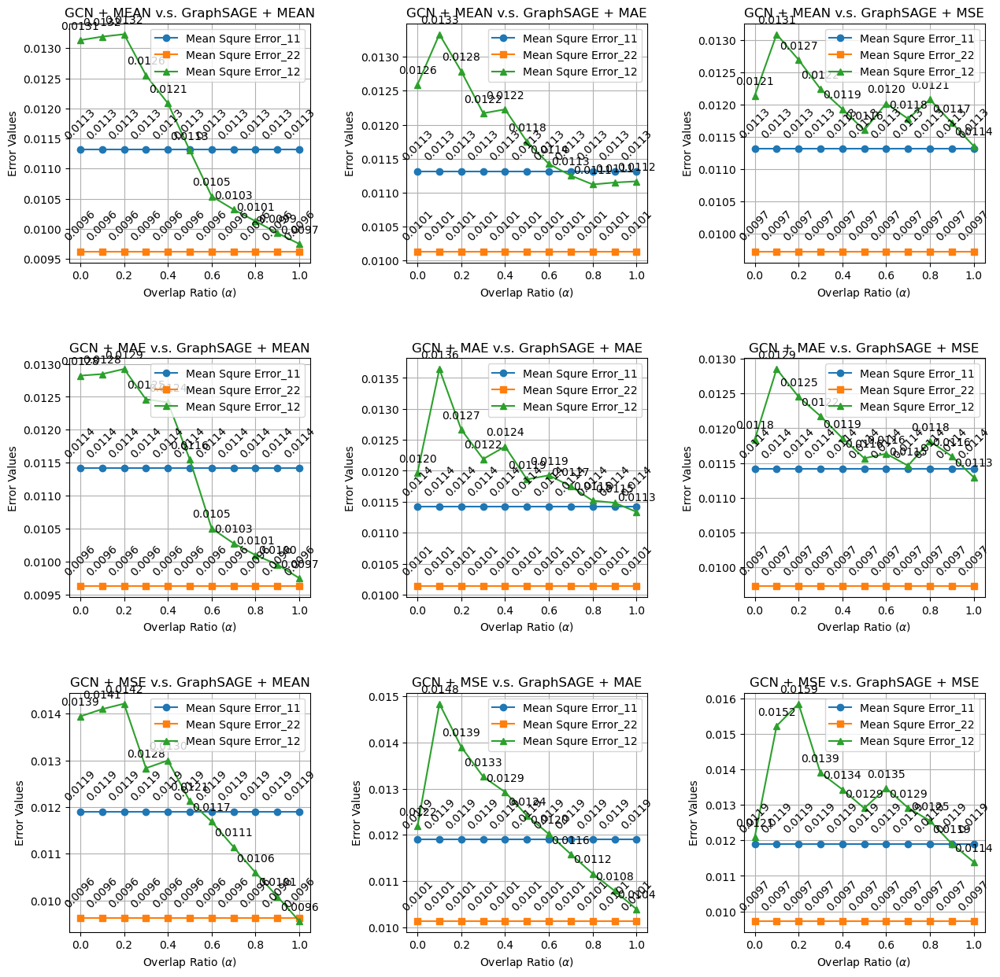

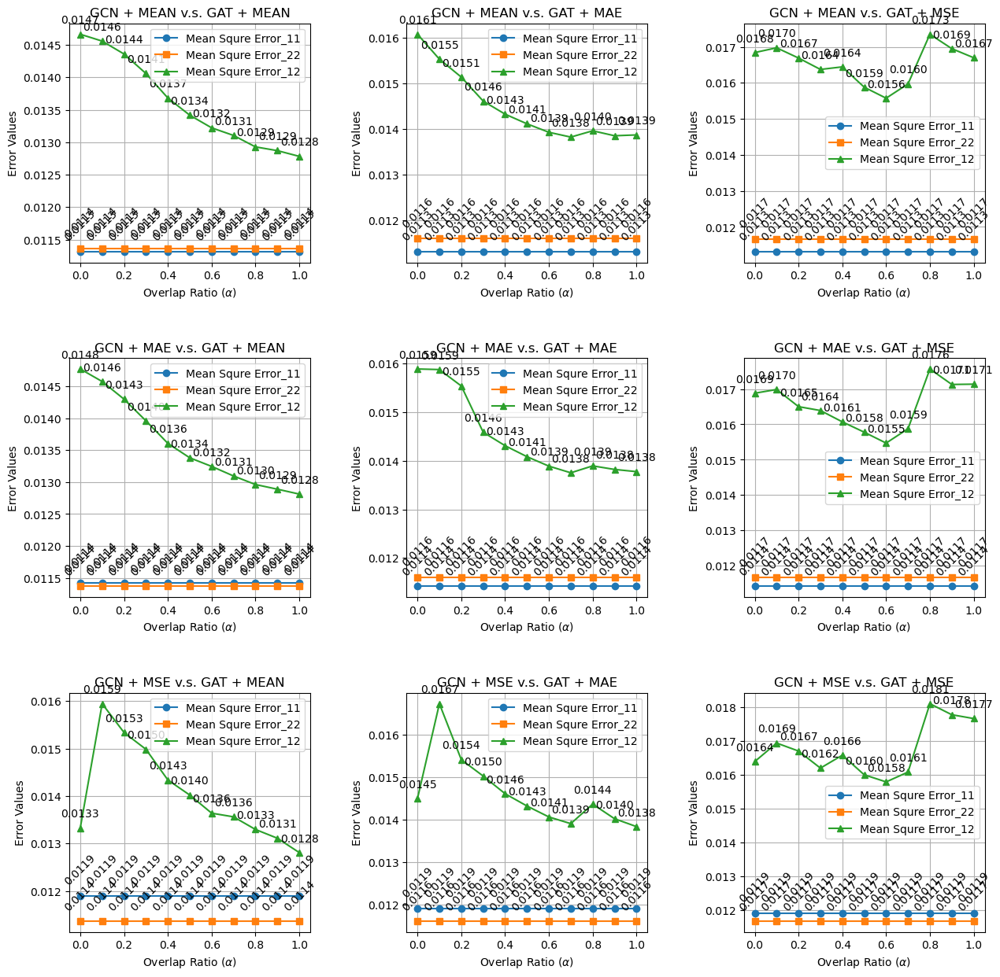

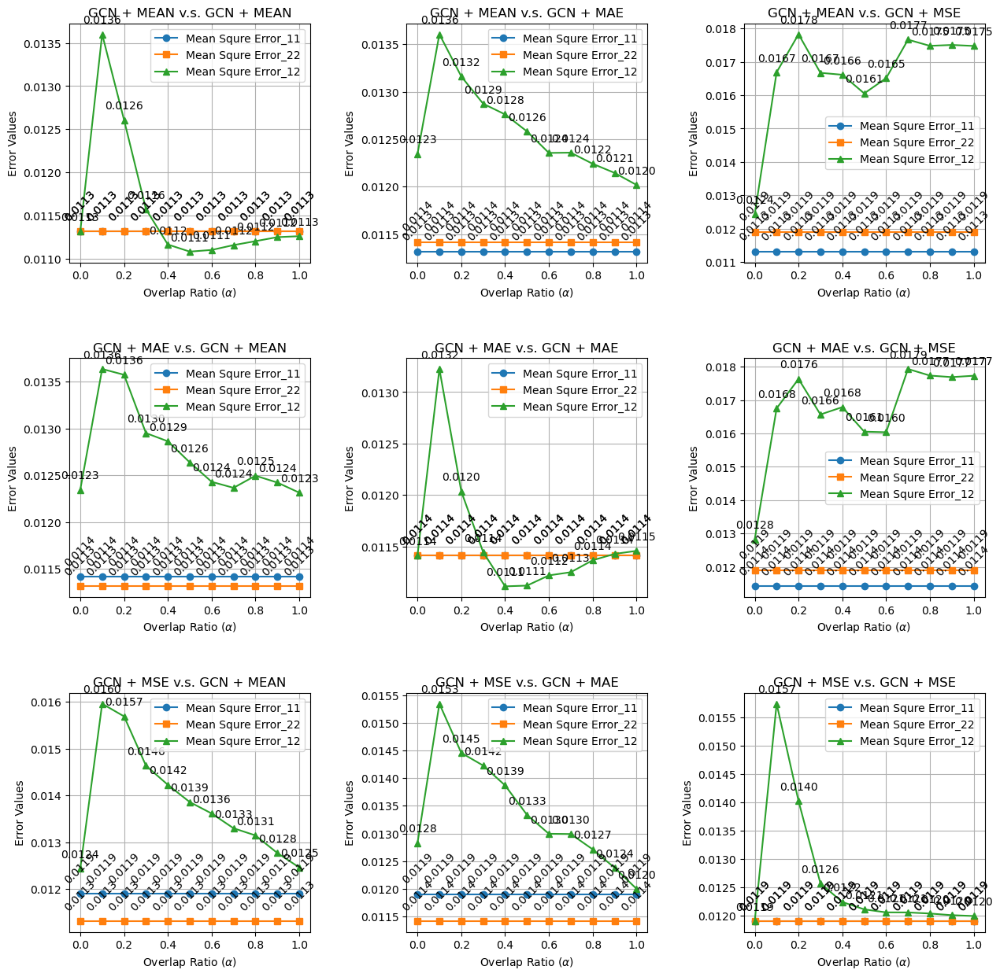

In [49]:
import os
error_function = "mse"
models = df['gnn_model1'].unique()
loss_types = df['loss_type1'].unique()
import matplotlib.pyplot as plt
for model1 in models:
    for model2 in models:
        fig, axs = plt.subplots(3, 3, figsize=(15, 15))
        fig.subplots_adjust(hspace=0.4, wspace=0.4)
        for k, loss1 in enumerate(loss_types):
            for l, loss2 in enumerate(loss_types):
                sub_df = df.query(f'gnn_model1 == "{model1}" and gnn_model2 == "{model2}" and loss_type1 == "{loss1}" and loss_type2 == "{loss2}"')
                ax = axs[k, l]  # 选择对应的子图
                plot_subdf(ax, sub_df, error_function)
                ax.set_title(f"{model1} + {loss1} v.s. {model2} + {loss2}")
        if os.path.exists(f"./factors/{error_function}") is False:
            os.makedirs(f"./factors/{error_function}")
        plt.savefig(f"./factors/{error_function}/{model1}_{model2}_subplots.png")
        # .title(f"{error_function}")
        plt.show()

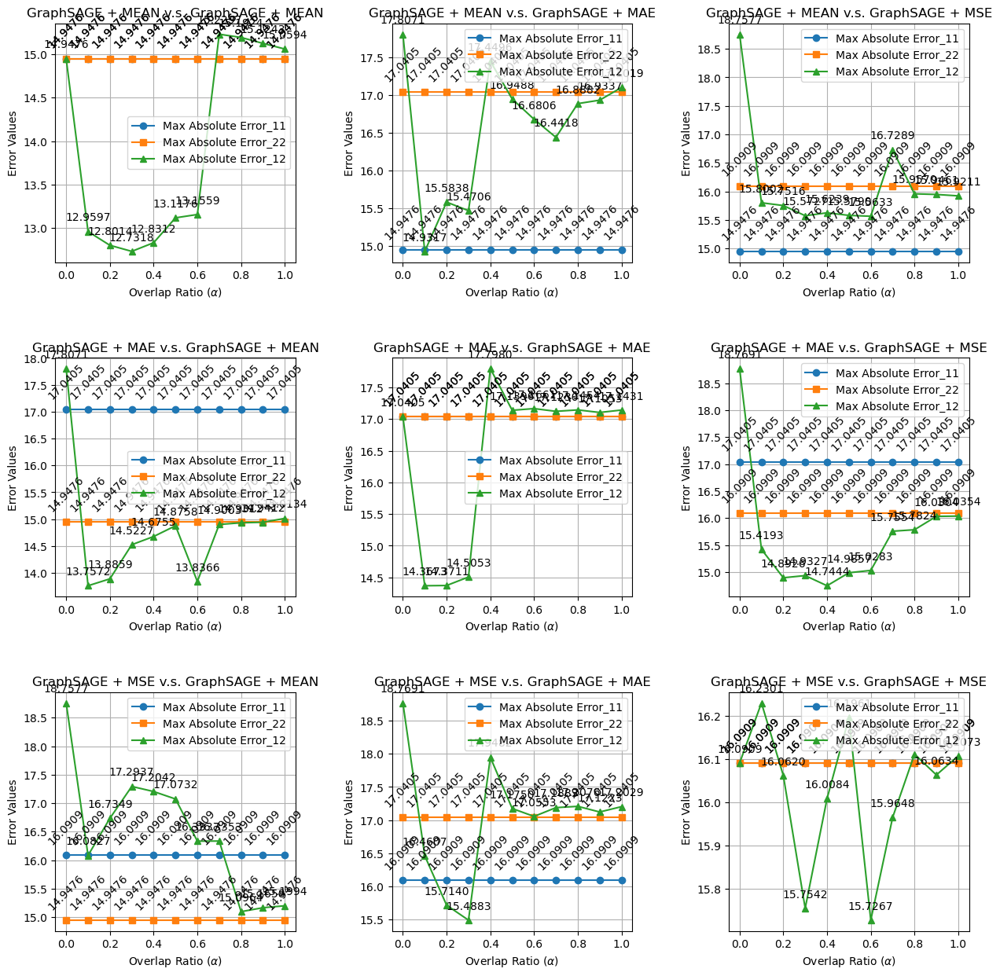

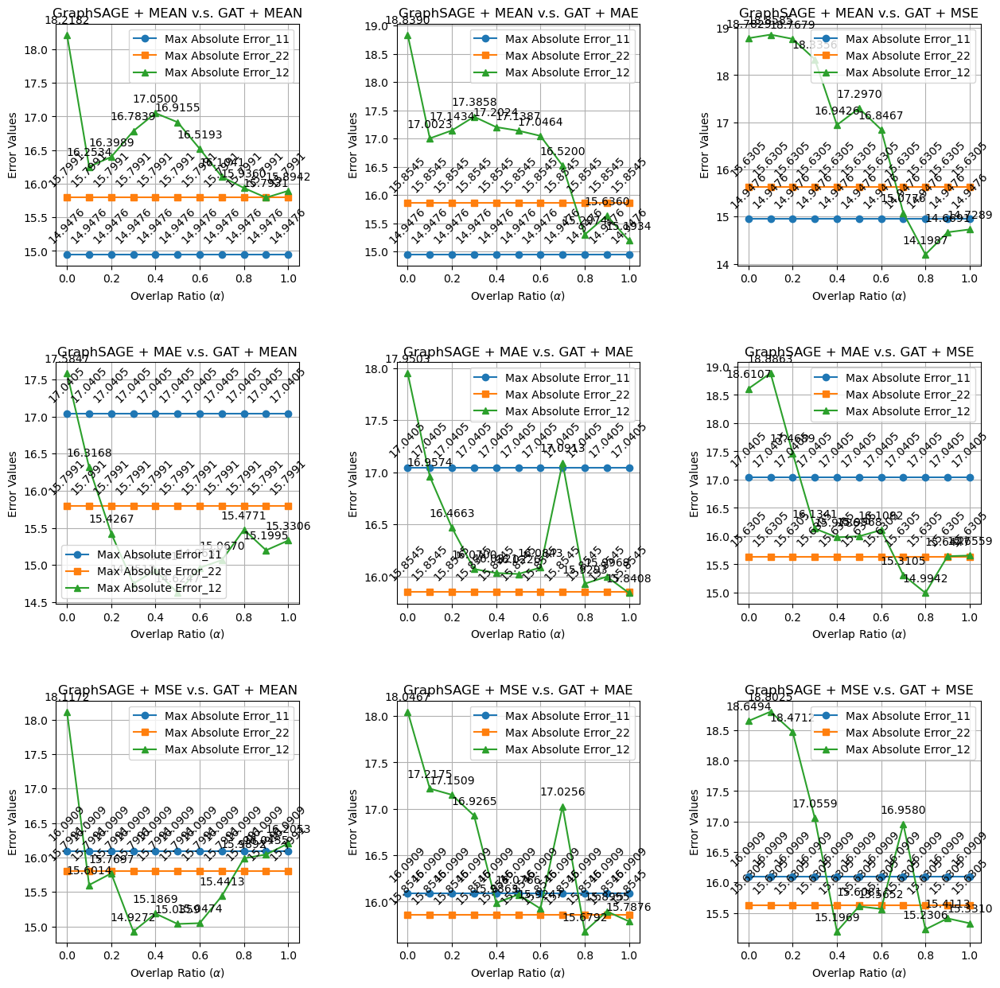

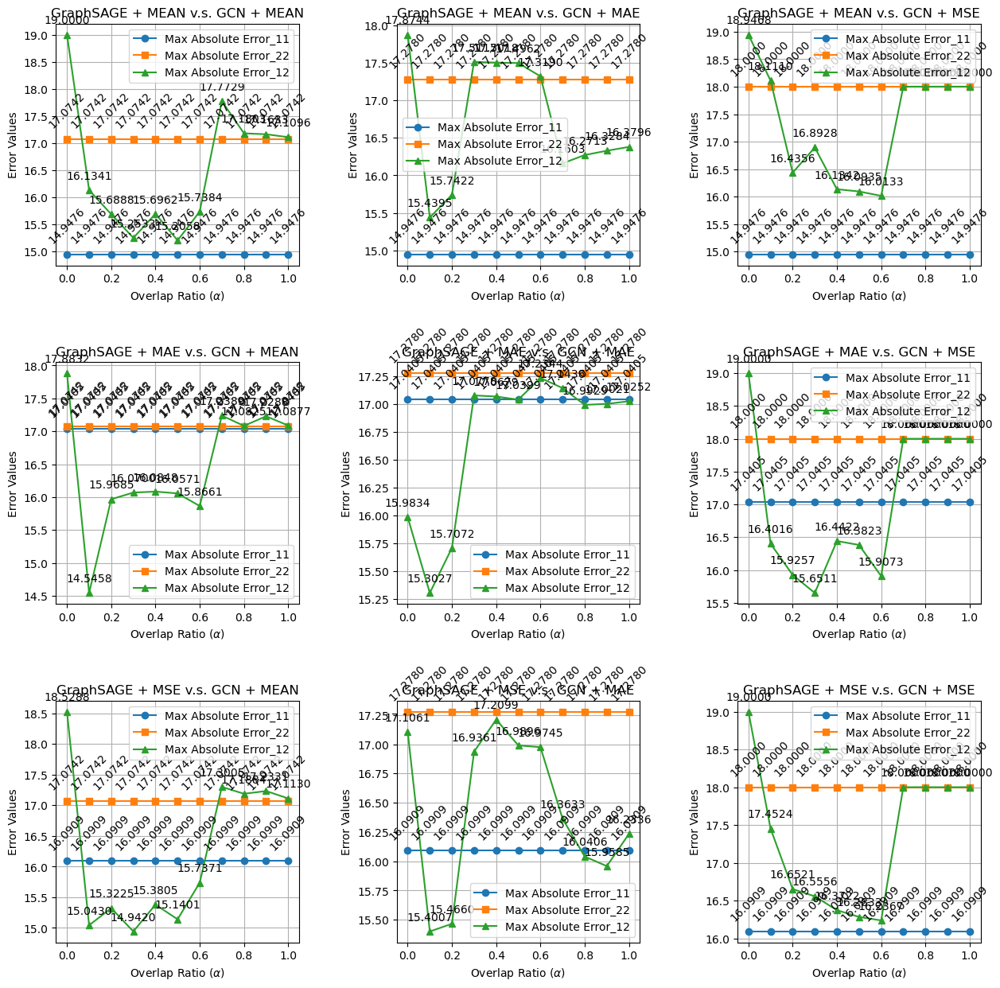

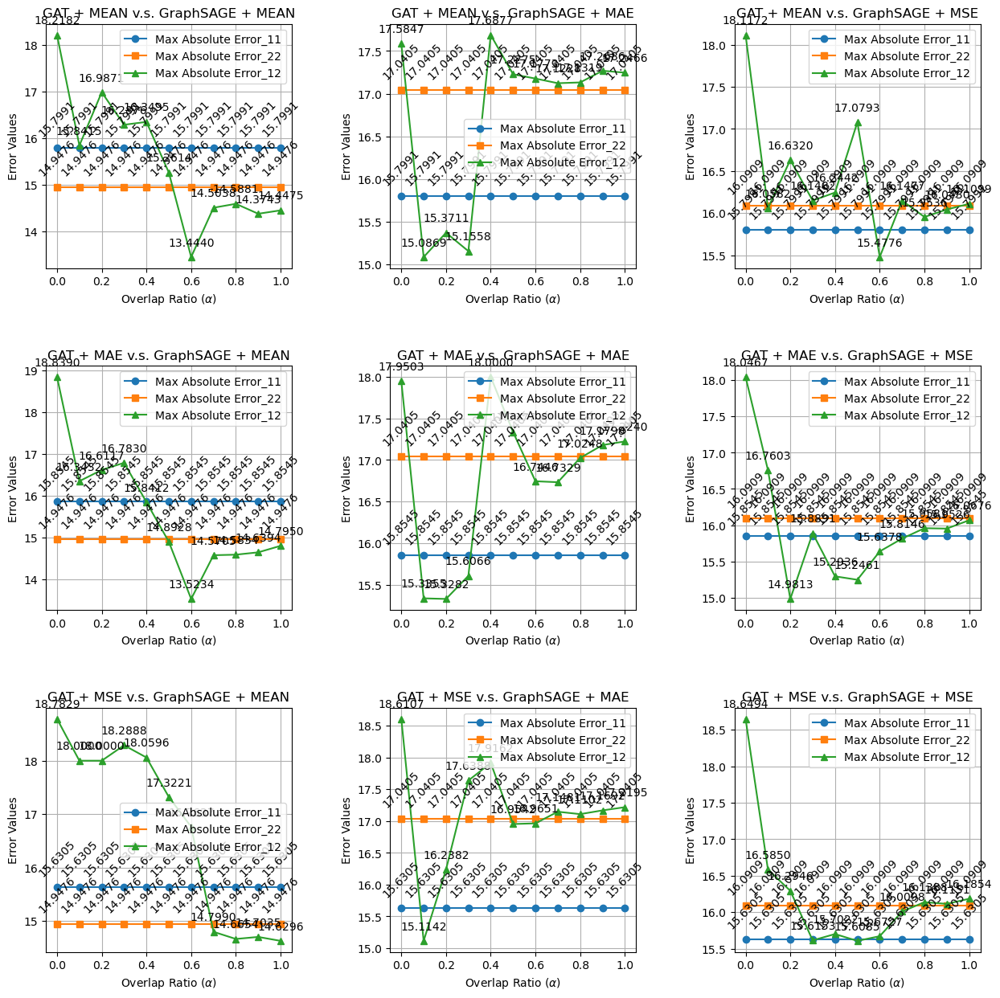

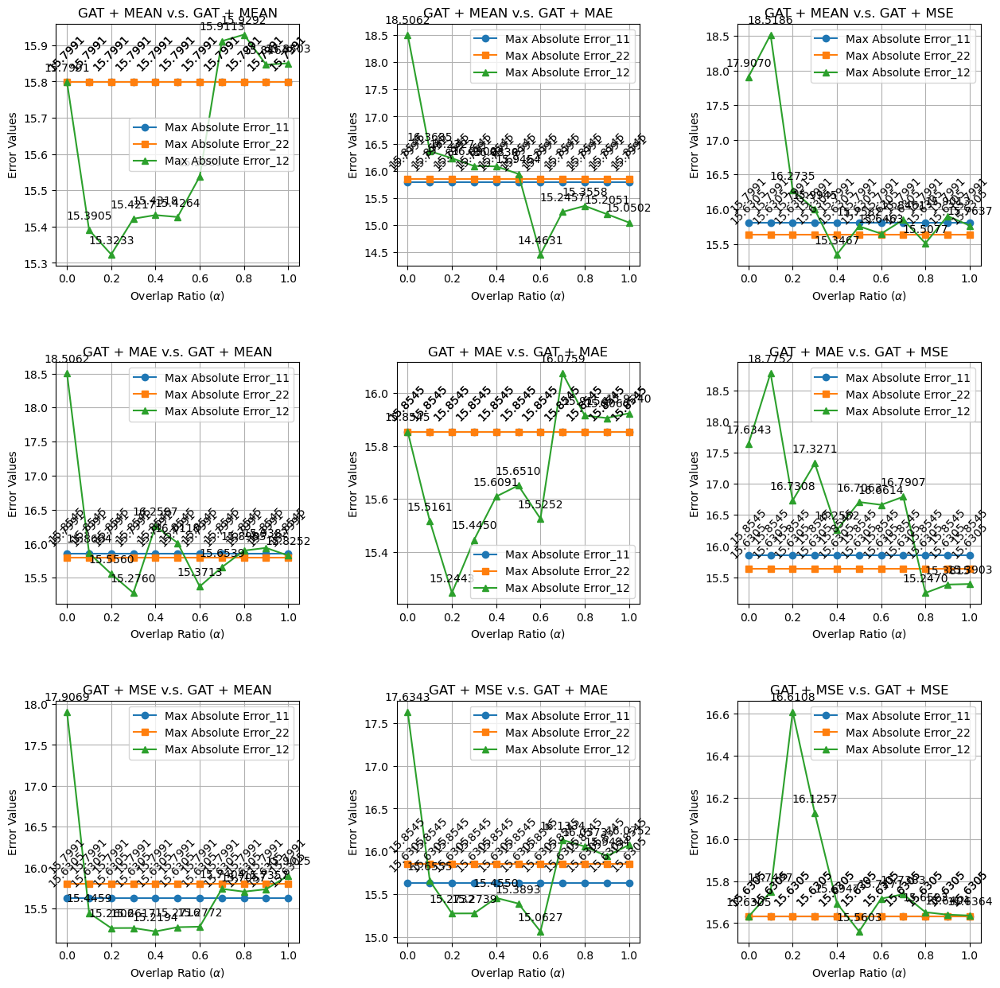

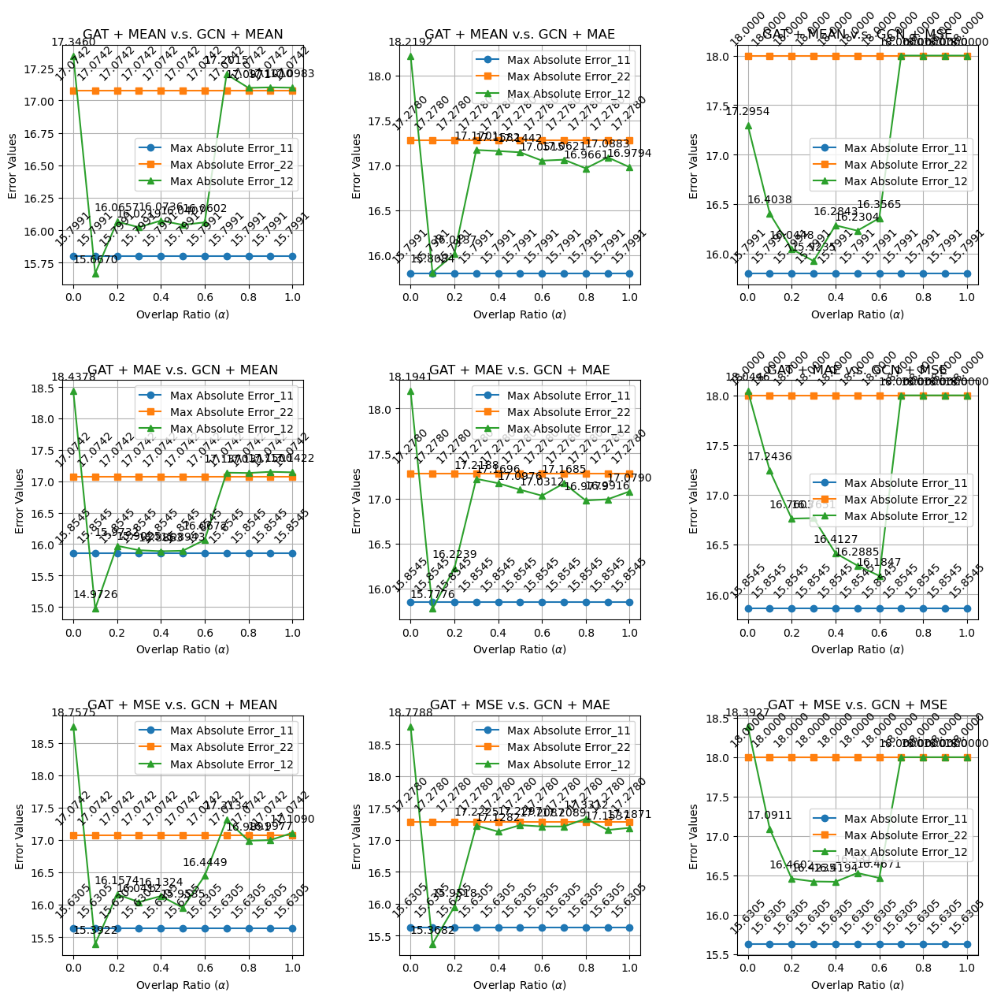

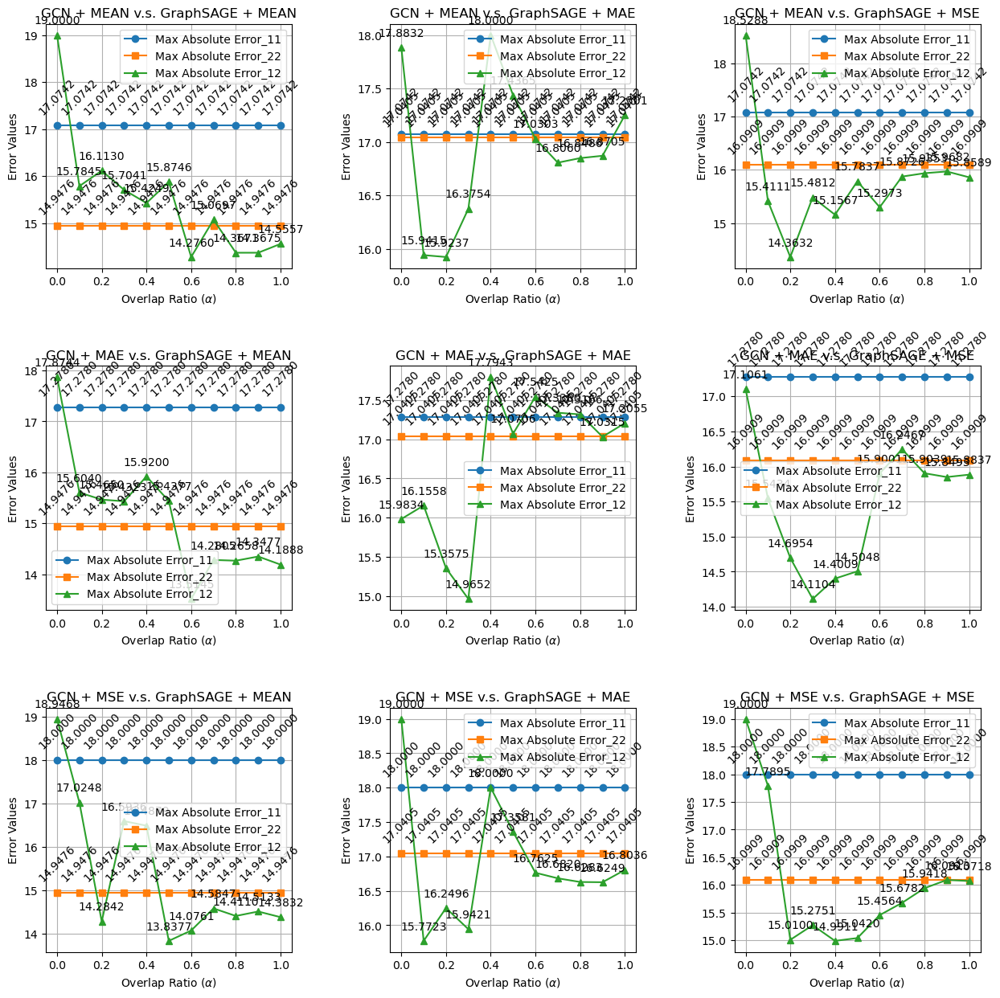

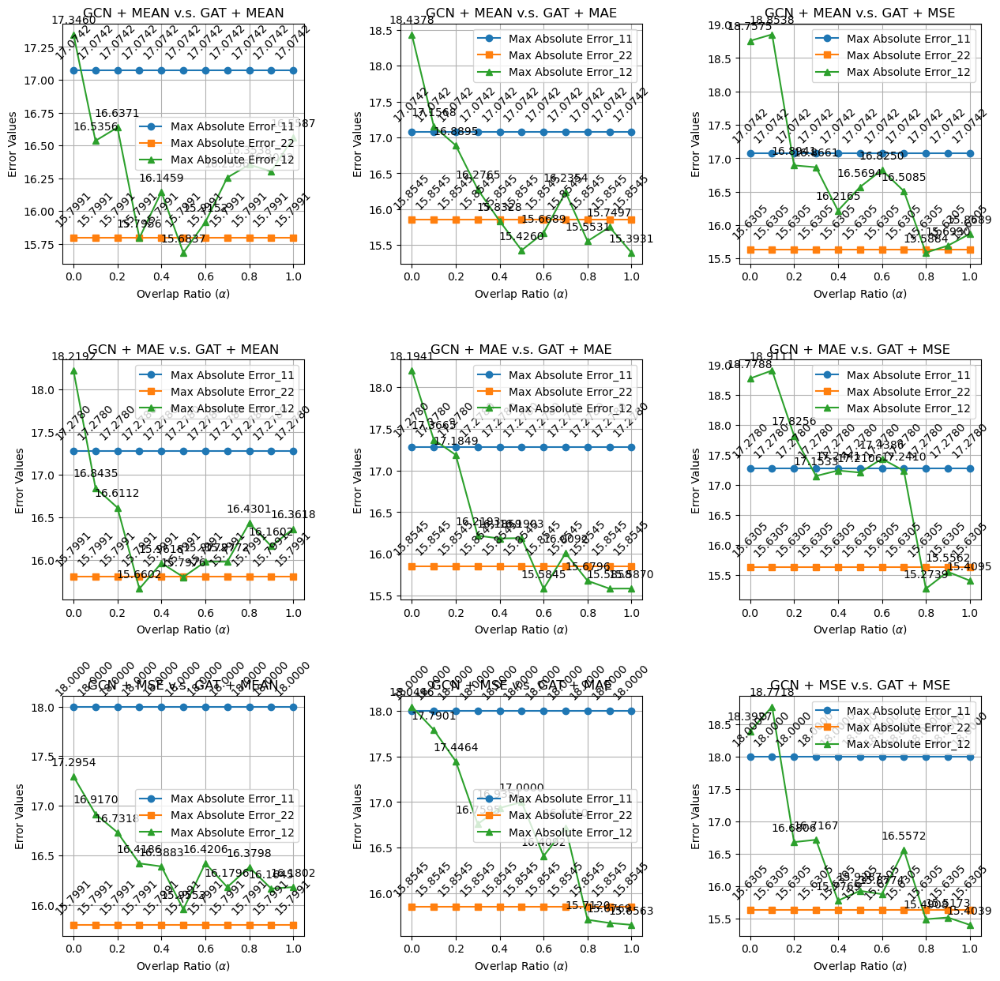

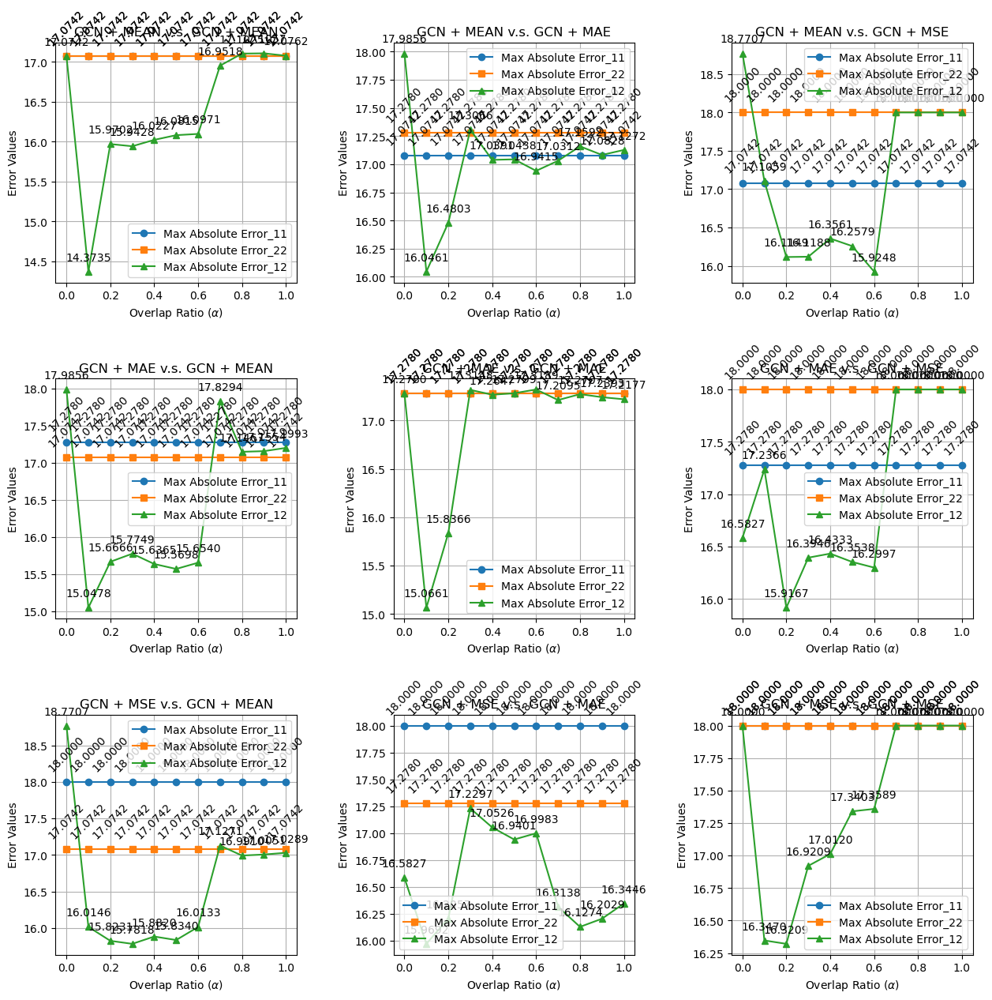

In [53]:
import os
error_function = "me"
models = df['gnn_model1'].unique()
loss_types = df['loss_type1'].unique()
import matplotlib.pyplot as plt
for model1 in models:
    for model2 in models:
        fig, axs = plt.subplots(3, 3, figsize=(15, 15))
        fig.subplots_adjust(hspace=0.4, wspace=0.4)
        for k, loss1 in enumerate(loss_types):
            for l, loss2 in enumerate(loss_types):
                sub_df = df.query(f'gnn_model1 == "{model1}" and gnn_model2 == "{model2}" and loss_type1 == "{loss1}" and loss_type2 == "{loss2}"')
                ax = axs[k, l]  # 选择对应的子图
                plot_subdf(ax, sub_df, error_function)
                ax.set_title(f"{model1} + {loss1} v.s. {model2} + {loss2}")
        if os.path.exists(f"./factors/{error_function}") is False:
            os.makedirs(f"./factors/{error_function}")
        plt.savefig(f"./factors/{error_function}/{model1}_{model2}_subplots.png")
        # .title(f"{error_function}")
        plt.show()

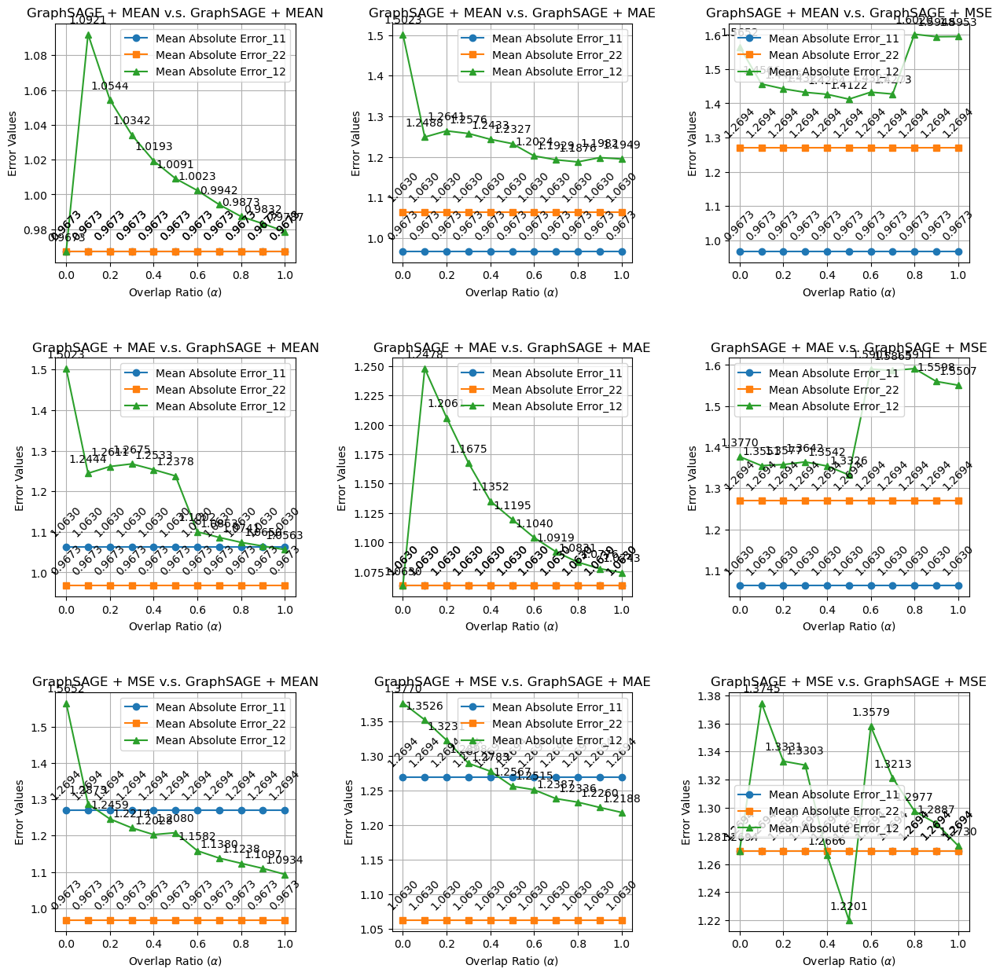

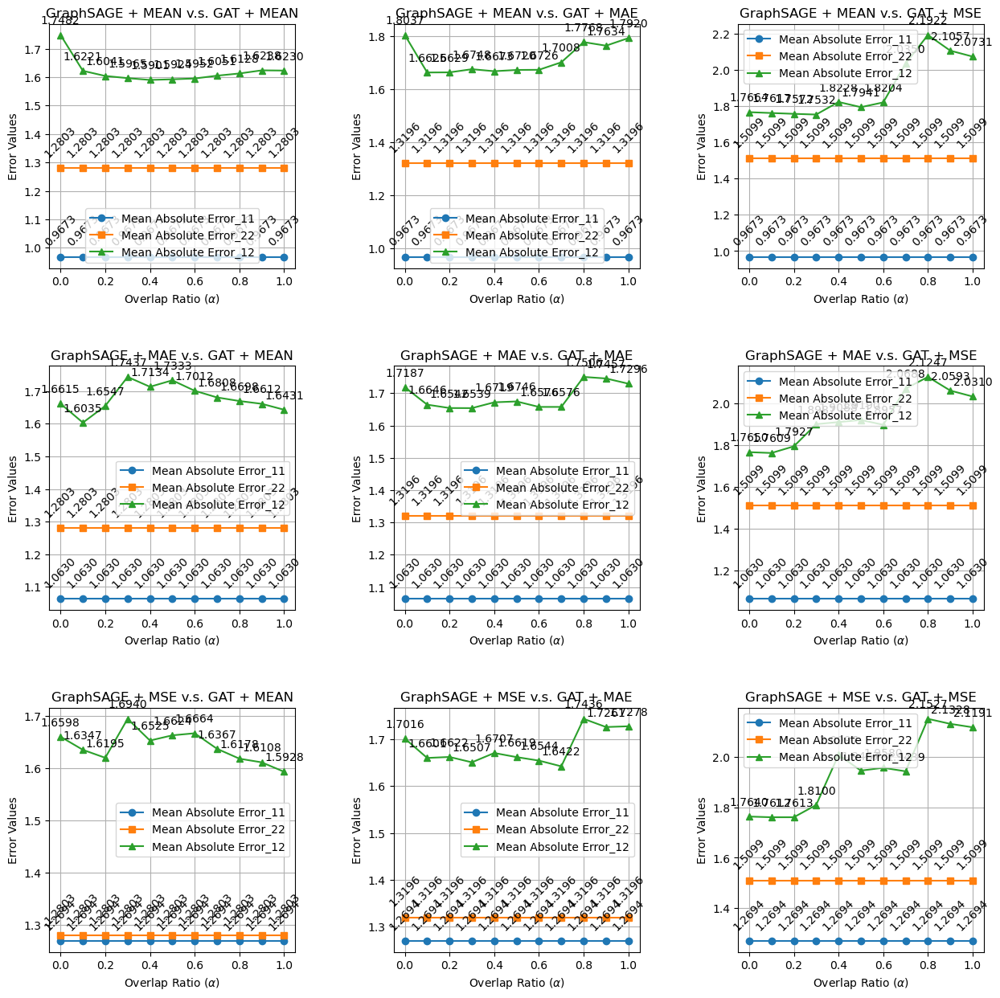

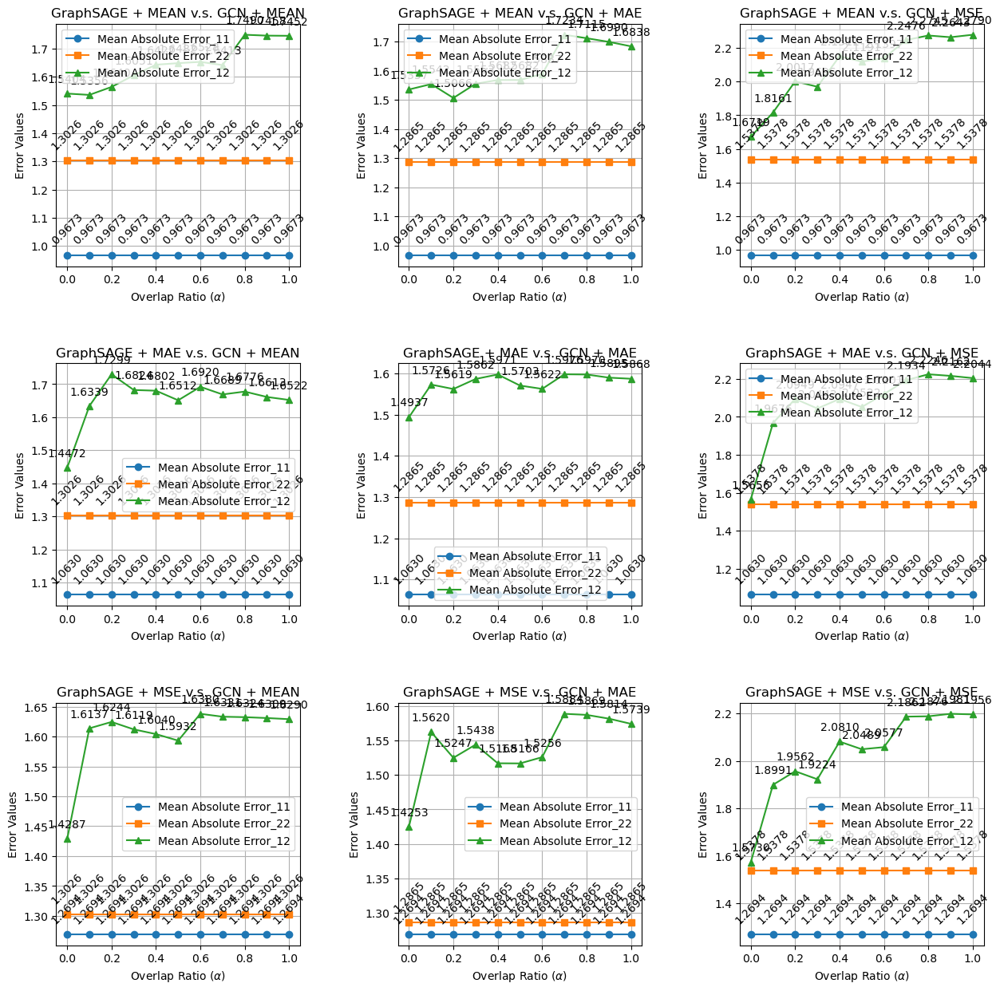

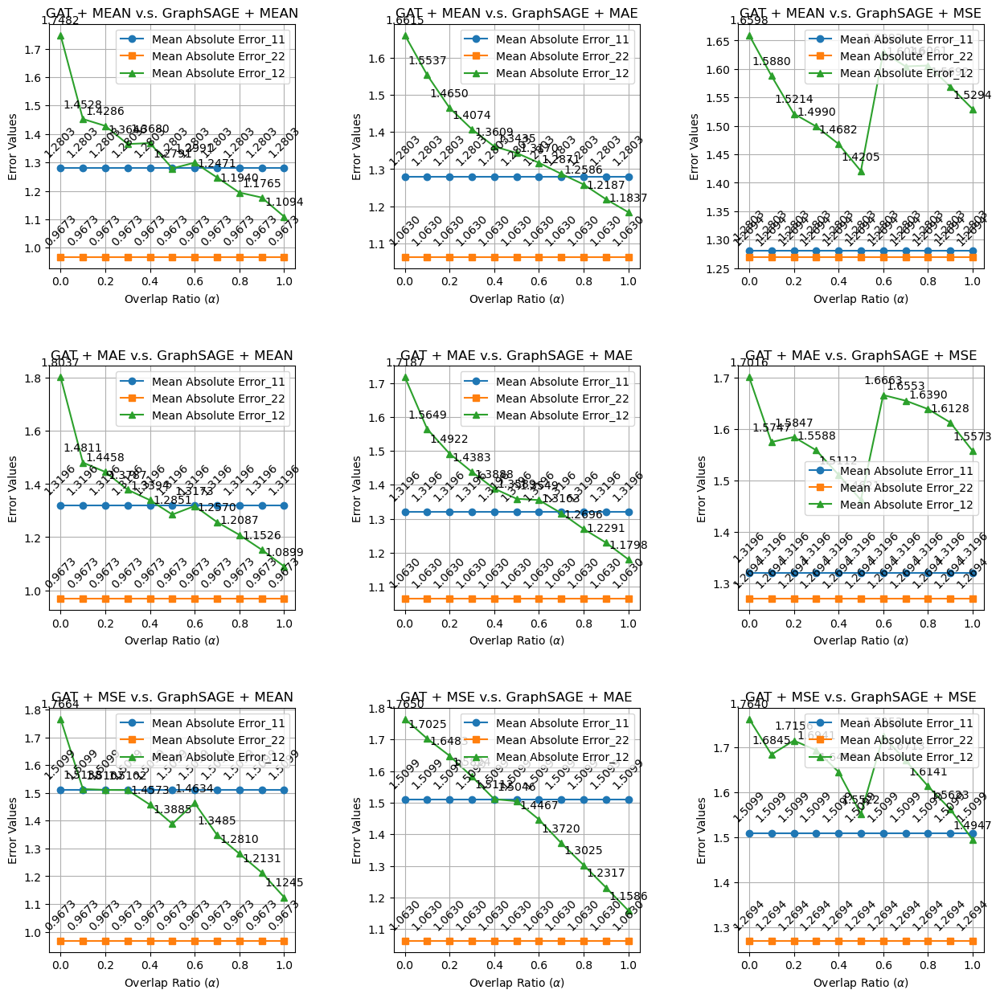

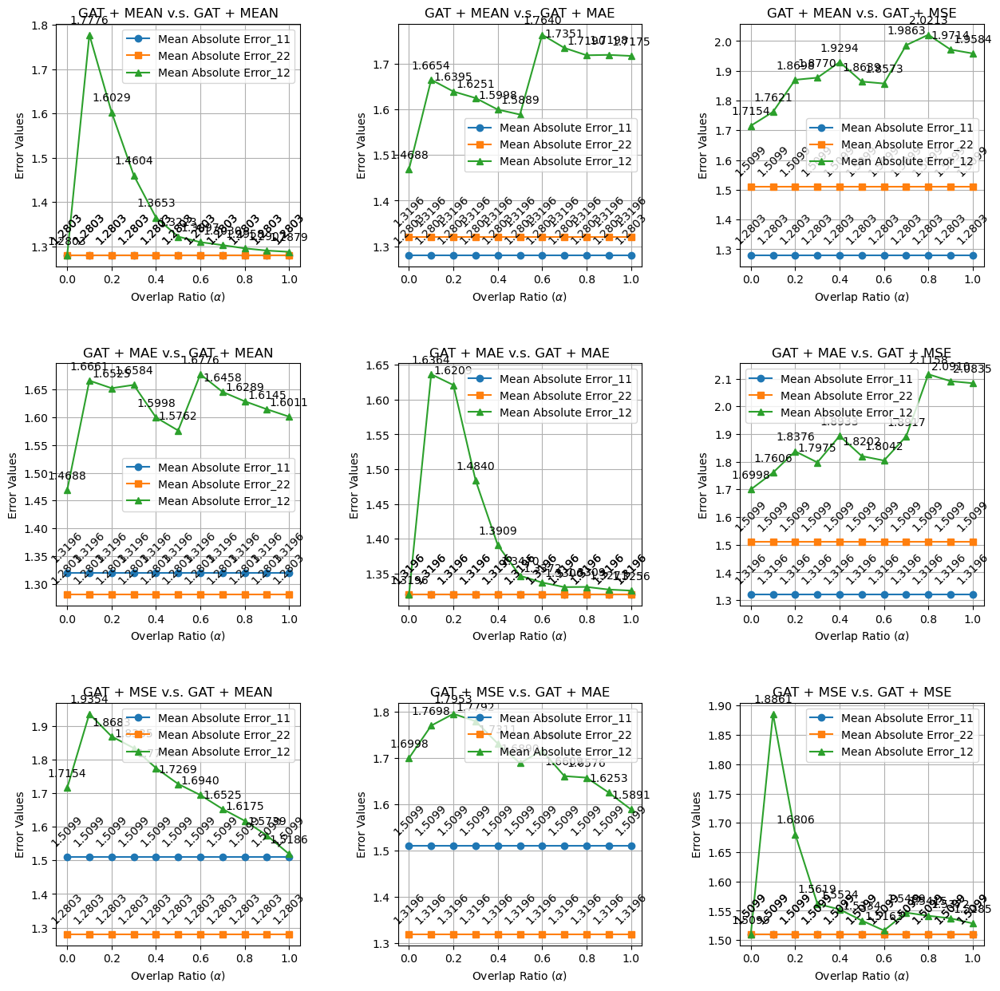

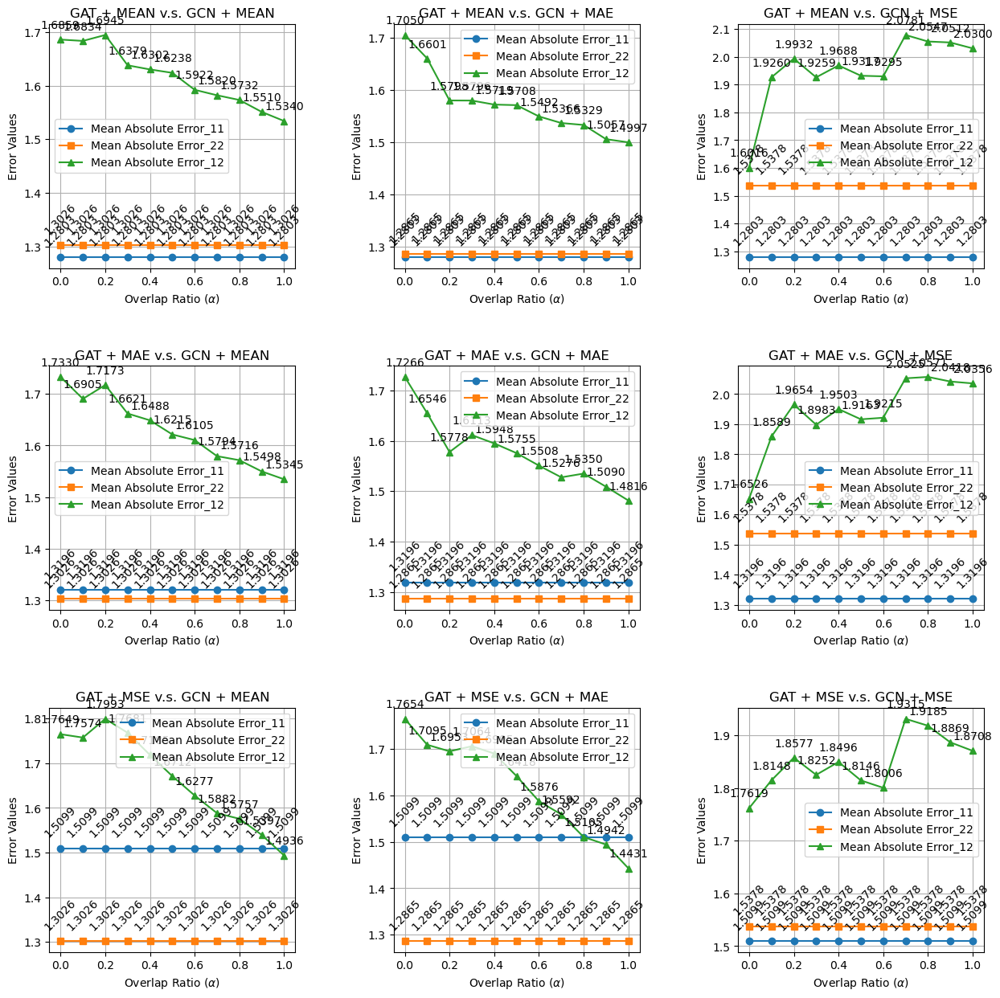

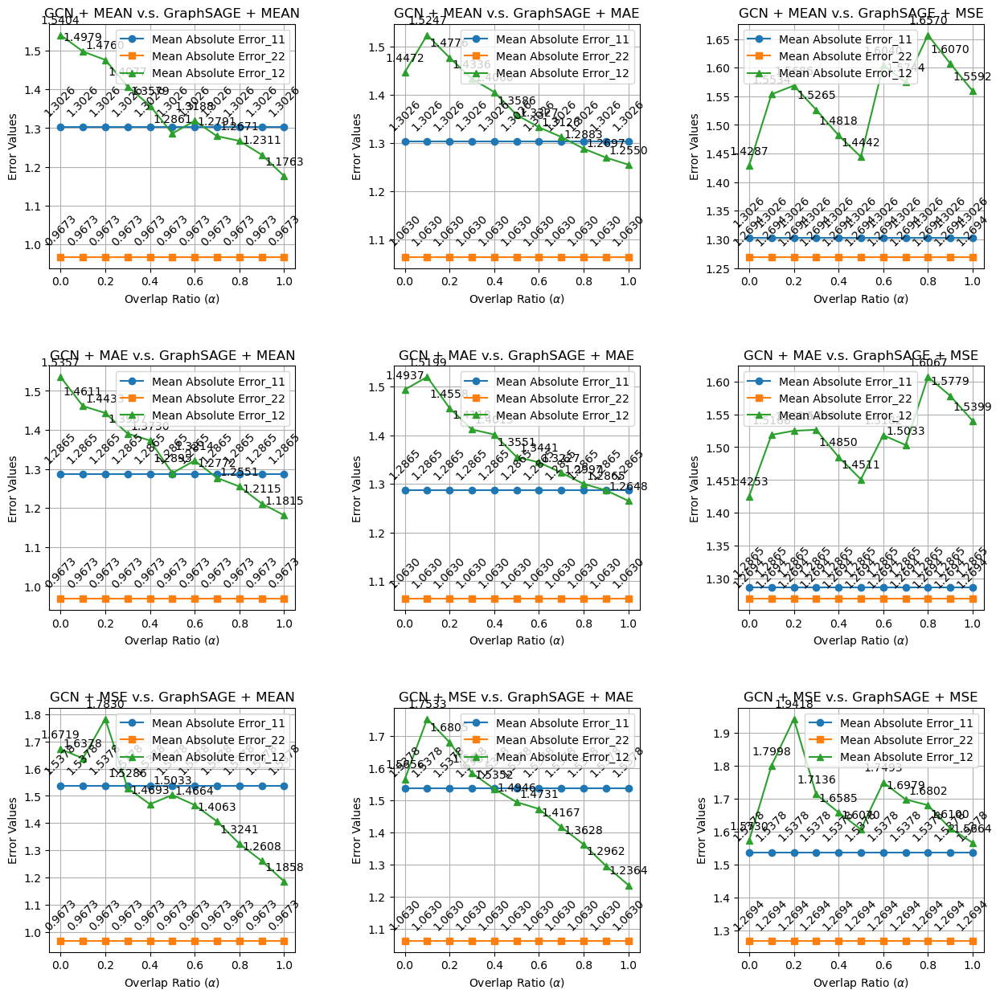

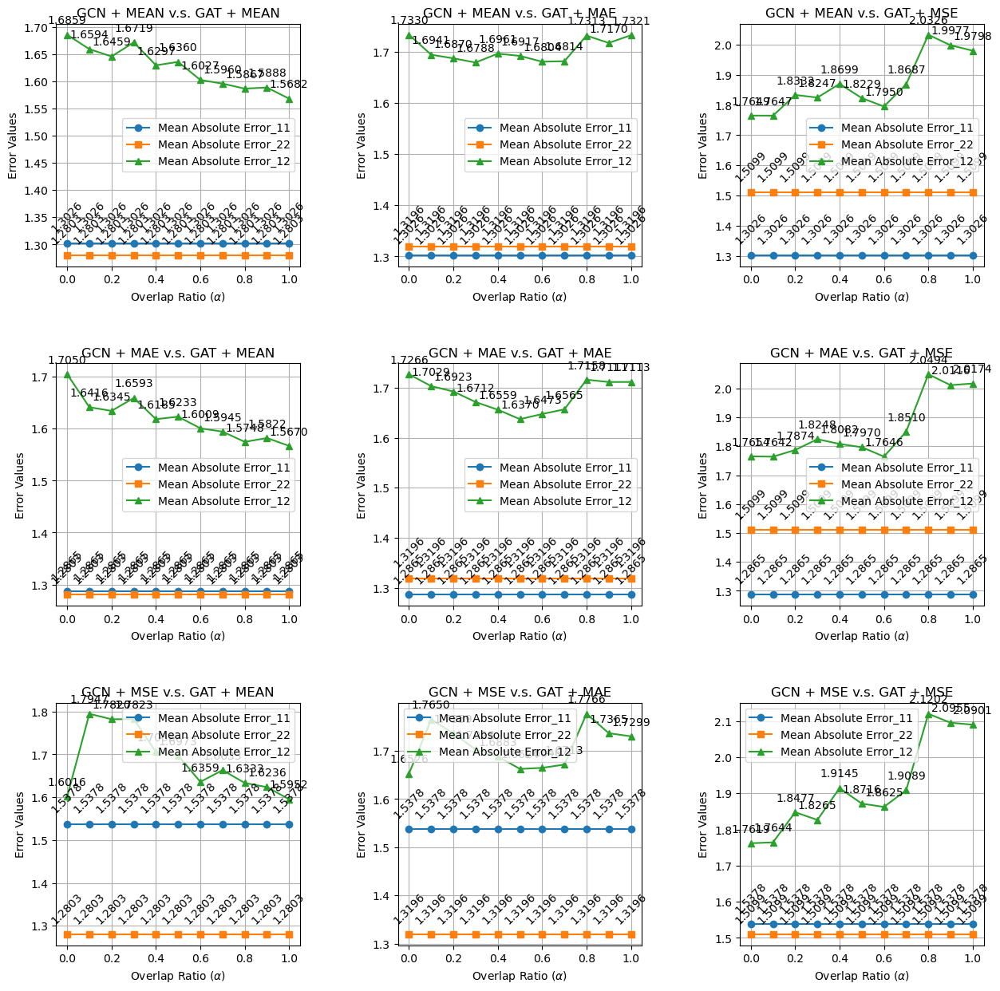

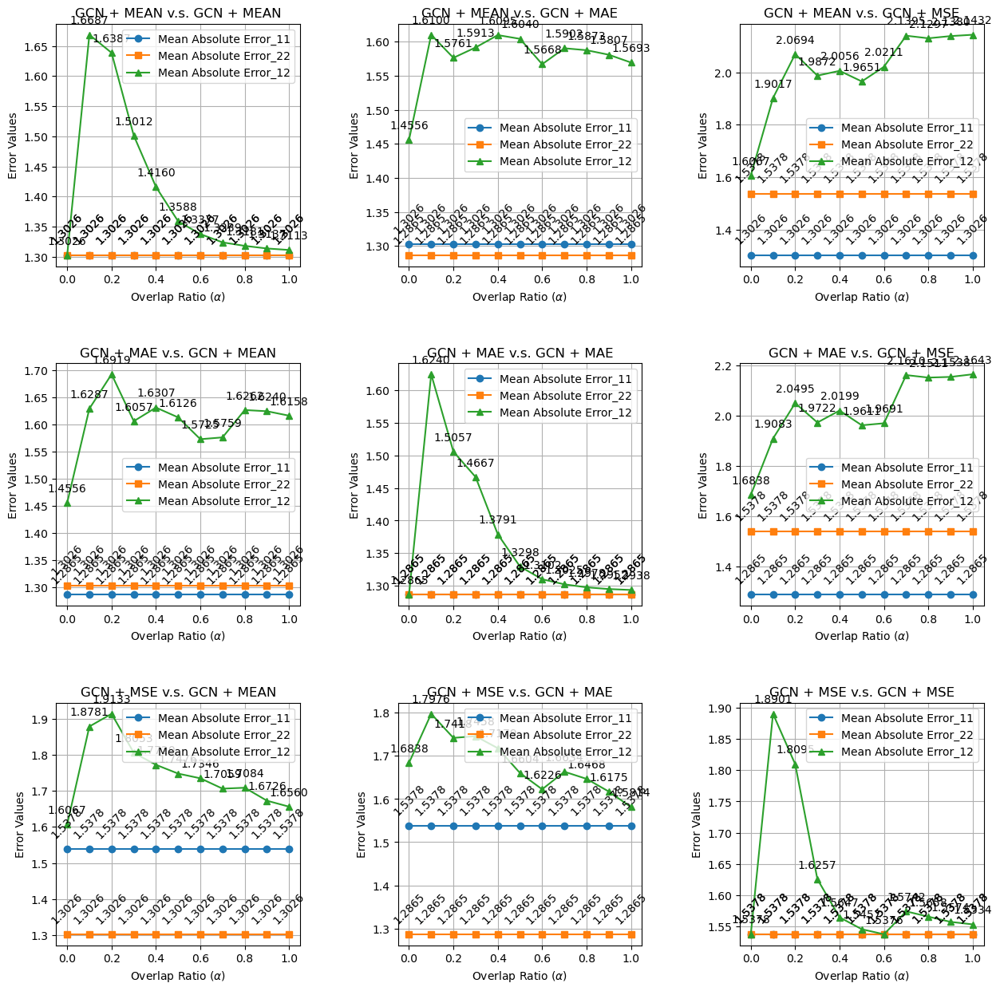

In [54]:
import os
error_function = "ae"
models = df['gnn_model1'].unique()
loss_types = df['loss_type1'].unique()
import matplotlib.pyplot as plt
for model1 in models:
    for model2 in models:
        fig, axs = plt.subplots(3, 3, figsize=(15, 15))
        fig.subplots_adjust(hspace=0.4, wspace=0.4)
        for k, loss1 in enumerate(loss_types):
            for l, loss2 in enumerate(loss_types):
                sub_df = df.query(f'gnn_model1 == "{model1}" and gnn_model2 == "{model2}" and loss_type1 == "{loss1}" and loss_type2 == "{loss2}"')
                ax = axs[k, l]  # 选择对应的子图
                plot_subdf(ax, sub_df, error_function)
                ax.set_title(f"{model1} + {loss1} v.s. {model2} + {loss2}")
        if os.path.exists(f"./factors/{error_function}") is False:
            os.makedirs(f"./factors/{error_function}")
        plt.savefig(f"./factors/{error_function}/{model1}_{model2}_subplots.png")
        # .title(f"{error_function}")
        plt.show()

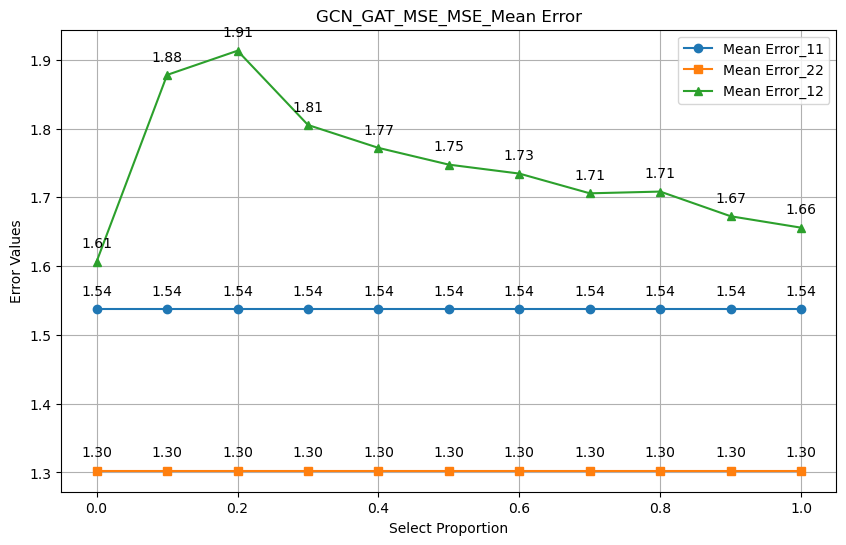